In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

#import lsst.ip.diffim as ipDiffim
# I linked from ip_diffim/python/lsst/ip/diffim/imageMapReduce.py into diffimTests/imageMapReduce.py
#    (or copy it)

In [2]:
import diffimTests as dit
#reload(dit)

testObj = dit.DiffimTest(varFlux2=np.repeat(5000, 10),
                         n_sources=2500, verbose=True, sourceFluxRange=(2000., 120000.), 
                         psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.496900586013 0.49697534519
Variable source: 0 27.5566532578 52.2695490543 0 5000
Variable source: 1 473.946169062 82.0660059762 0 5000
Variable source: 6 264.934448791 473.644859787 0 5000
Variable source: 13 461.433898475 257.635099177 0 5000
Variable source: 4 98.4740485947 124.220153248 0 5000
Variable source: 8 270.509775289 54.4215221419 0 5000
Variable source: 5 372.965995421 364.840312941 0 5000
Variable source: 11 138.217230786 151.800973325 0 5000
Variable source: 9 153.959622485 328.716736962 0 5000
Variable source: 12 176.065768691 271.481445164 0 5000


/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice
  warnings.warn("Degrees of freedom <= 0 for slice", RuntimeWarning)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:94: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:116: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


{'Zogy': {'FP': 81, 'FN': 1, 'TP': 9}, 'ALstack': {'FP': 1, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 10, 'FN': 1, 'TP': 9}, 'ALstack_decorr': {'FP': 0, 'FN': 1, 'TP': 9}}


In [3]:
exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

A&L(dec): stats(mean=0.12310036, stdev=25.876051, min=-217.29417, max=324.14203)
Zogy: stats(mean=-0.050611990738954983, stdev=27.061387137416776, min=-677.99252233870516, max=1021.6333106295938)
A&L(dec) - Zogy: stats(mean=0.063175598081040285, stdev=4.2876910913152022, min=-921.94946510957425, max=731.60676870711336)
A&L(dec) - A&L: stats(mean=-0.038295474, stdev=7.0649548, min=-57.474472, max=56.582626)


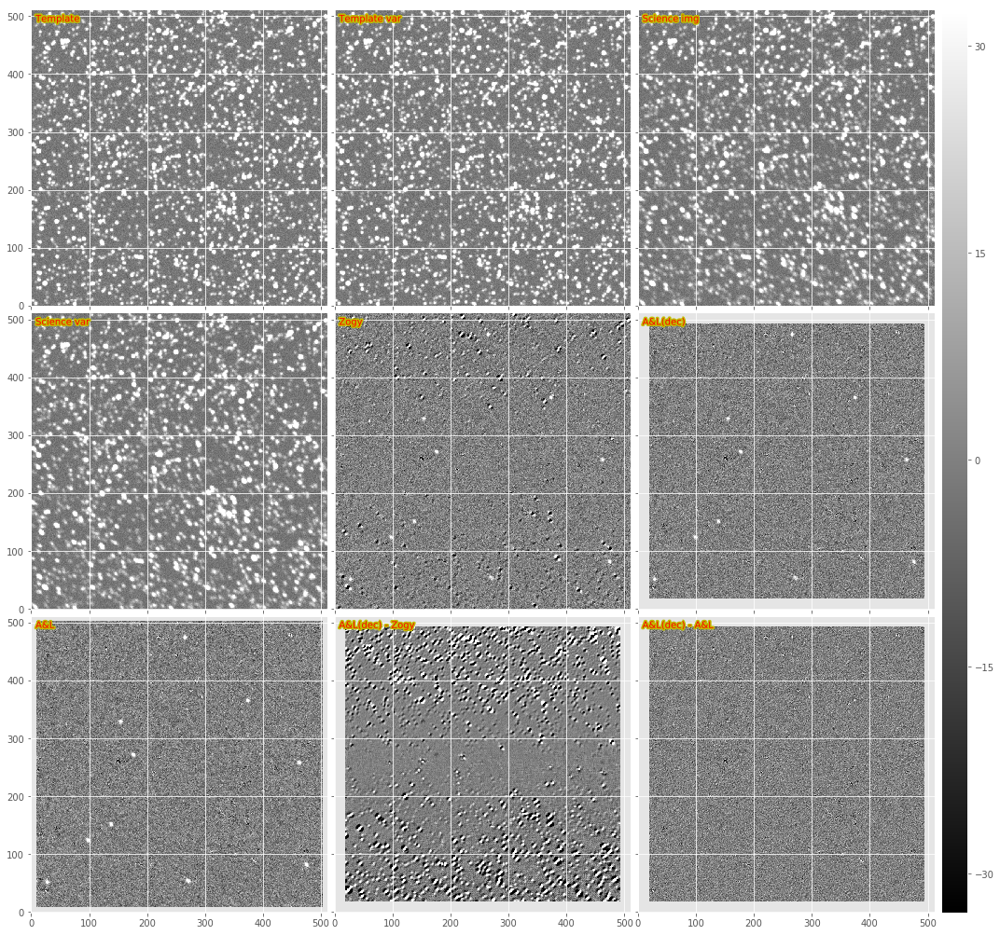

In [4]:
#dit.plotImageGrid((testObj.im1.im, testObj.im2.im), imScale=8)
testObj.doPlot(imScale=6);

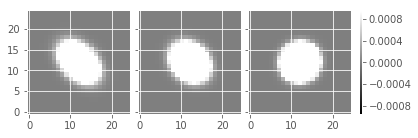

In [5]:
dit.plotImageGrid((testObj.variablePsf.getImage(20., 20.), 
                   testObj.variablePsf.getImage(250., 250.),
                   testObj.variablePsf.getImage(500., 500.)))

OK, let's try a spatially-varying ZOGY! But without correctly setting the (spatially varying) PSF of the diffim.

In [6]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(dit.ImageMapperSubtask):
    ConfigClass = dit.ImageMapperSubtaskConfig
    _DefaultName = 'diffimTests_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        dit.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
        inImageSpace = kwargs.get('inImageSpace', False)
                
        # Psf and image for science img (index 2)
        subExp2 = subExp
        if variablePsf2 is None:
            psf2 = subExp.getPsf().computeImage(center).getArray()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
        psf2_orig = psf2
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        template = kwargs.get('template')
        subExp1 = afwImage.ExposureF(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        psf1_orig = psf1
        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]
        
        #shape2 = subExp2.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #shape1 = subExp1.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this really helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        D_zogy, var_zogy = None, None
        if not inImageSpace:
            padSize0 = subarr1.shape[0]//2 - psf1.shape[0]//2
            padSize1 = subarr1.shape[1]//2 - psf1.shape[1]//2
            # Hastily assume the image is even-sized and the psf is odd... and that the two images
            #   and psfs have the same dimensions!
            psf1 = np.pad(psf1b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            psf2 = np.pad(psf2b, ((padSize0, padSize0-1), (padSize1, padSize1-1)), mode='constant',
                          constant_values=0)
            if psf1.shape[0] > subarr1.shape[0]:
                psf1 = psf1[:-1, :]
                psf2 = psf2[:-1, :]
            elif psf1.shape[0] < subarr1.shape[0]:
                psf1 = np.pad(psf1, ((0, 1), (0, 0)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 1), (0, 0)), mode='constant', constant_values=0)
            if psf1.shape[1] > subarr1.shape[1]:
                psf1 = psf1[:, :-1]
                psf2 = psf2[:, :-1]
            elif psf1.shape[1] < subarr1.shape[1]:
                psf1 = np.pad(psf1, ((0, 0), (0, 1)), mode='constant', constant_values=0)
                psf2 = np.pad(psf2, ((0, 0), (0, 1)), mode='constant', constant_values=0)
            #psf1 = dit.psf.recenterPsf(psf1)
            #psf2 = dit.psf.recenterPsf(psf2)
            psf1 /= psf1.sum()
            psf2 /= psf2.sum()

            #shape2 = dit.arrayToAfwPsf(psf2).computeShape(afwGeom.Point2D(center[0], center[1]))
            #shape1 = dit.arrayToAfwPsf(psf1).computeShape(afwGeom.Point2D(center[0], center[1]))
            #print center, shape2, shape1

            D_zogy, var_zogy = dit.zogy.performZogy(subarr1, subarr2,
                                                subvar1, subvar2,
                                                psf1, psf2, 
                                                sig1=sig1, sig2=sig2)
        else:
            D_zogy, var_zogy = dit.zogy.performZogyImageSpace(subarr1, subarr2,
                                                           subvar1, subvar2,
                                                           psf1, psf2, 
                                                           sig1=sig1, sig2=sig2, padSize=7)
            #print 'HERE:', subExp.getBBox(), np.sum(~np.isnan(D_zogy)), np.sum(~np.isnan(var_zogy))

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()
        tmpIM.getImage().getArray()[:, :] = D_zogy
        tmpIM.getVariance().getArray()[:, :] = var_zogy
        # need to eventually compute diffim PSF and set it here.
        out = afwImage.ExposureF(tmpExp, subExp.getBBox())
                
        #print template
        #img += 10.
        #return out #, psf1_orig, psf2_orig
        return pipeBase.Struct(subExposure=out)

class ZogyMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

In [7]:
config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
#config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [8]:
newExp = task.run(exposure, template=template).exposure #, variablePsf=testObj.variablePsf)

In [9]:
# Run with constant variance number to compare with single frame (non-gridded) ZOGY from above:
sig1 = np.sqrt(dit.computeClippedImageStats(template.getMaskedImage().getVariance().getArray()).mean)
sig2 = np.sqrt(dit.computeClippedImageStats(exposure.getMaskedImage().getVariance().getArray()).mean)
print sig1, sig2
newExpA = task.run(exposure, template=template, sigmas=[sig1, sig2]).exposure

17.638 17.9594


In [10]:
# Run with ZOGY in image space... ugh. Need bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExpB = task.run(exposure, template=template, sigmas=[sig1, sig2], inImageSpace=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


In [11]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()

stats(mean=22.539099, stdev=35.877453, min=-69.0, max=4570.0)
stats(mean=-0.12831298, stdev=27.122225, min=-951.26727, max=1022.7976)
stats(mean=-0.13163829, stdev=27.115377, min=-946.23975, max=1021.6334)
stats(mean=-0.041794304, stdev=27.036648, min=-677.99658, max=1021.6309)
stats(mean=18.072645, stdev=26.242624, min=-38.923569, max=4099.9609)
stats(mean=-0.00020865162473042355, stdev=0.056243741729131956, min=-952.85066186123356, max=400.08989644461508)
stats(mean=-4.1158912309123195e-08, stdev=5.1771346699988986e-05, min=-947.82313500576481, max=400.11491704398031)
stats(mean=0.00047802039750915266, stdev=0.0021908274424197677, min=-0.022126434403610062, max=0.055210423029933509)


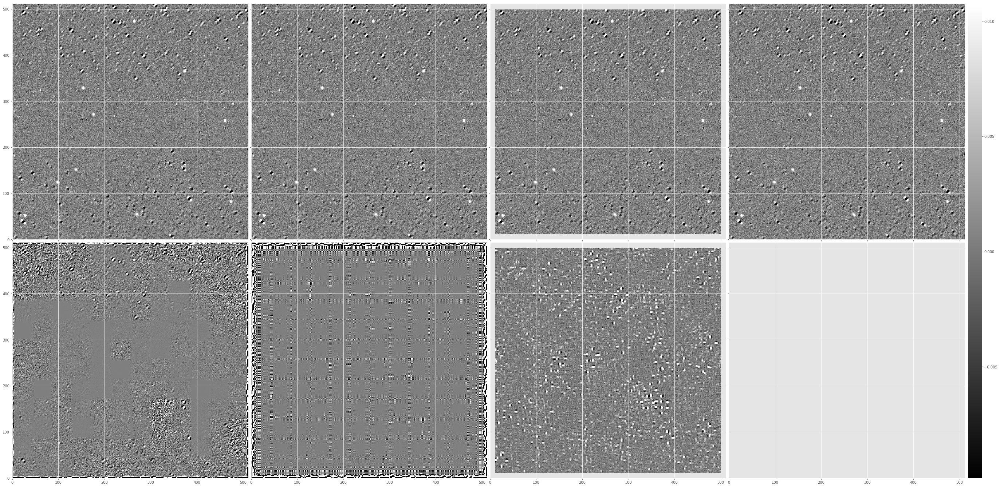

In [12]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExpA))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpA) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_Zogy.im)
dit.plotImageGrid((ga(newExp), ga(newExpA), ga(newExpB), testObj.D_Zogy.im, ga(newExp)-testObj.D_Zogy.im,
                  ga(newExpA)-testObj.D_Zogy.im, ga(newExpB)-testObj.D_Zogy.im), imScale=12)

Looks good, let's see what's going on on the edges...

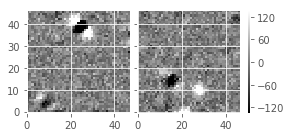

In [13]:
subexps = task._runMapper(exposure, template=template, sigmas=[sig1, sig2])
dit.plotImageGrid((subexps[0].subExposure, subexps[1].subExposure))

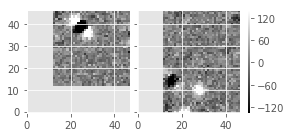

In [14]:
subexps = task._runMapper(exposure, template=template, sigmas=[sig1, sig2], inImageSpace=True)
dit.plotImageGrid((subexps[0].subExposure, subexps[1].subExposure))

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


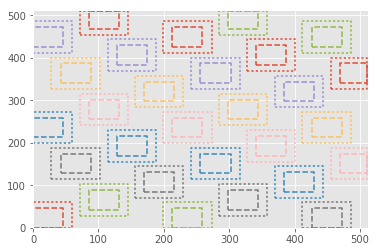

In [15]:
print task.config
task._plotBoxes(exposure.getBBox(), skip=5)

### try with *input* but variable psf.

In [16]:
newExp = task.run(exposure, template=template, variablePsf=testObj.variablePsf).exposure

stats(mean=22.539099, stdev=35.877453, min=-69.0, max=4570.0)
stats(mean=-0.030957261, stdev=25.792631, min=-862.91016, max=314.42288)
stats(mean=17.56897, stdev=25.680994, min=-37.962524, max=4714.7954)
stats(mean=-0.046350187395256037, stdev=3.1989982929933447, min=-1150.9162085788125, max=775.09818182356844)


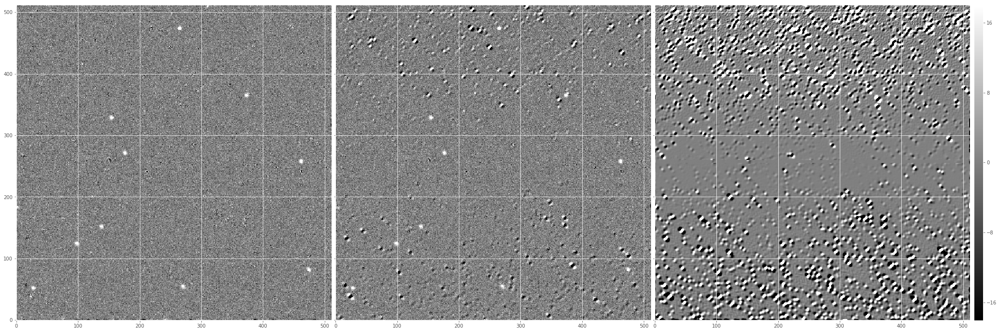

In [17]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
dit.plotImageGrid((ga(newExp), testObj.D_Zogy.im, ga(newExp)-testObj.D_Zogy.im), imScale=12)

In [18]:
newExpB = task.run(exposure, template=template, inImageSpace=True, variablePsf=testObj.variablePsf).exposure

stats(mean=22.539099, stdev=35.877453, min=-69.0, max=4570.0)
stats(mean=0.02650574, stdev=25.741463, min=-228.50677, max=314.49316)
stats(mean=18.291855, stdev=26.462246, min=-37.95726, max=4714.8003)
stats(mean=-0.034952374464550899, stdev=3.0099785045126093, min=-1150.9340155856485, max=775.0886755979825)
stats(mean=0.00067889254, stdev=0.0067524542, min=-0.50197554, max=0.99198055)


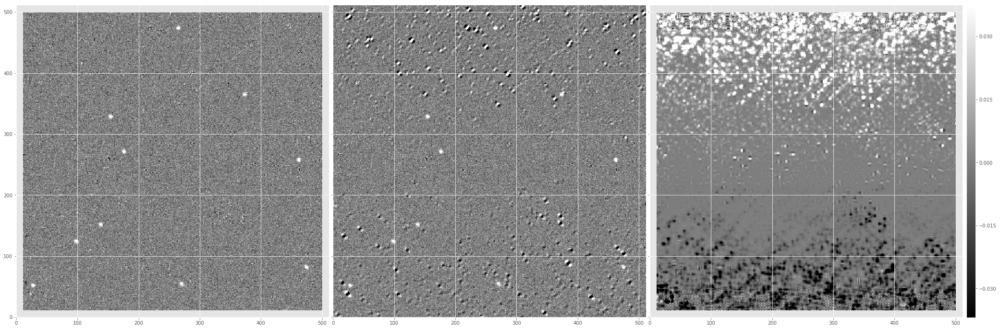

In [19]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExpB))
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpB) - ga(newExp))
dit.plotImageGrid((ga(newExpB), testObj.D_Zogy.im, ga(newExpB)-ga(newExp)), imScale=12)

### re-do with measured psfs...

13


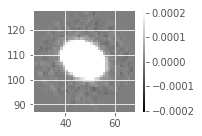

In [20]:
import lsst.meas.extensions.psfex as psfex

# copied ~/lsstsw/build/meas_extensions_psfex/tests/testPsfexPsf.py to ./testPsfexPsfEDITED.py
# then made some edits...
import testPsfexPsfEDITED as tpp
reload(tpp)
obj1 = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj1.makeExposure()
obj1.setUp()
obj1.testPsfexDeterminer()
dit.plotImageGrid((obj1.exposure.getPsf(),))

In [21]:
reload(tpp)
obj2 = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj2.setExposure(exposure)
obj2.setUp()
obj2.testPsfexDeterminer()

1309


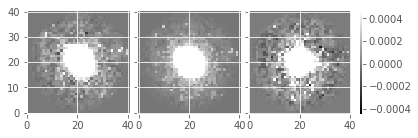

In [22]:
#dit.plotImageGrid((obj.exposure.getPsf(),))
psf = obj2.exposure.getPsf()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

Psfs from my images are definitely more noisy than the fake image in the Psfex test. Let's figure out whats going on in the images themselves.

In [23]:
mi1 = obj1.exposure.getMaskedImage()
mi2 = obj2.exposure.getMaskedImage()

print dit.computeClippedImageStats(mi1.getImage().getArray())
print dit.computeClippedImageStats(mi2.getImage().getArray())
print()
print dit.computeClippedImageStats(mi1.getVariance().getArray())
print dit.computeClippedImageStats(mi2.getVariance().getArray())

stats(mean=0.20954028, stdev=3.0907314, min=-12.13588, max=3484.6636)
stats(mean=22.539099, stdev=35.877453, min=-69.0, max=4570.0)
()
stats(mean=32.867466, stdev=163.26508, min=9.0, max=3505.3325)
stats(mean=322.53909, stdev=35.877453, min=231.0, max=4870.0)


/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:116: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/Users/dreiss/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


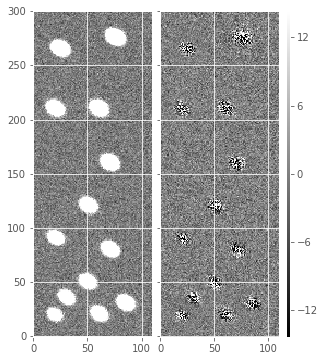

In [24]:
dit.plotImageGrid((obj1.exposure, obj1.subtracted), imScale=6)

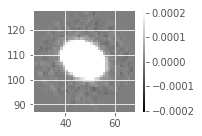

In [25]:
psf = obj1.exposure.getPsf()
dit.plotImageGrid((psf,))

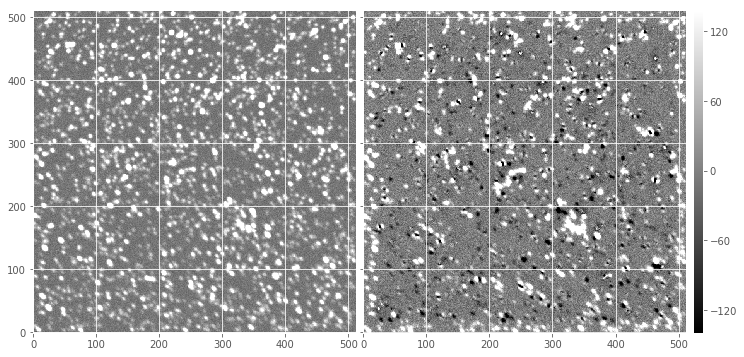

In [26]:
dit.plotImageGrid((obj2.exposure, obj2.subtracted), imScale=6)

Now run the test Psfex determiner on my images!

In [27]:
exposure2 = testObj.im2.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(exposure2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(template2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(template2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

1309
1370


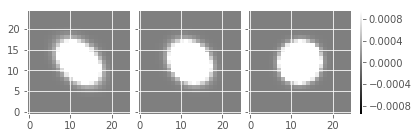

In [28]:
dit.plotImageGrid((testObj.variablePsf.getImage(40., 40.), 
                   testObj.variablePsf.getImage(250., 250.),
                   testObj.variablePsf.getImage(500., 500.)))

(41, 41)


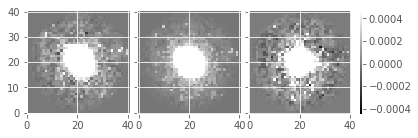

In [29]:
psf = exposure2.getPsf()
print psf.computeImage().getDimensions()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

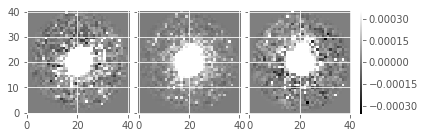

In [30]:
psf = template2.getPsf()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)),
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


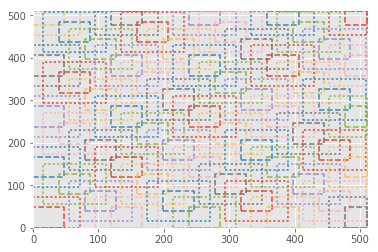

In [31]:
config = ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
#config.borderSizeX = config.borderSizeY = 7
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

newExp2 = task.run(exposure2, template=template2).exposure
task._plotBoxes(exposure2.getBBox())

stats(mean=22.539099, stdev=35.877453, min=-69.0, max=4570.0)
stats(mean=-0.030957261, stdev=25.792631, min=-862.91016, max=314.42288)
stats(mean=-0.4019812, stdev=26.991522, min=-1025.1426, max=453.18707)
stats(mean=27.241365, stdev=43.701389, min=-334.84442, max=4257.374)
stats(mean=-0.046350187395256037, stdev=3.1989982929933447, min=-1150.9162085788125, max=775.09818182356844)
stats(mean=-0.68662157668505752, stdev=30.147653819193902, min=-1023.0243304257037, max=1003.2605277097989)
stats(mean=0.40808266, stdev=28.963511, min=-582.46997, max=568.00177)


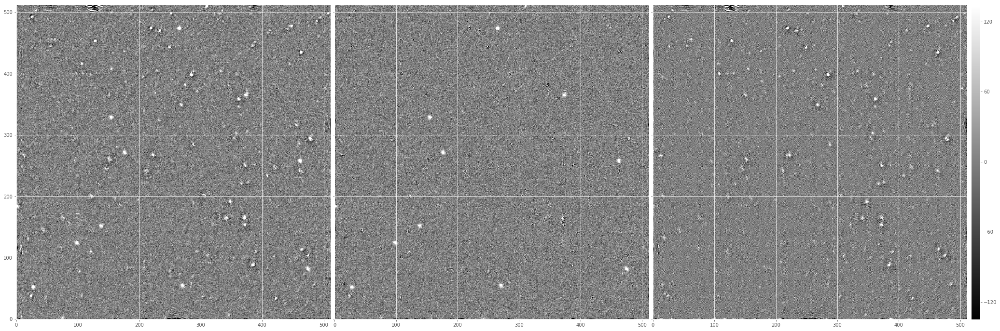

In [32]:
print dit.computeClippedImageStats(ga(exposure2))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExp2))
print dit.computeClippedImageStats(ga(exposure2)-ga(newExp2))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExp2) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExp) - ga(newExp2))
dit.plotImageGrid((ga(newExp2), ga(newExp), ga(newExp2) - ga(newExp)), #ga(newExp) - testObj.D_Zogy.im), 
                  imScale=12)

Let's see what detection looks like on the new ZOGY diffim...

In [33]:
testObj2 = testObj.clone()
testObj2.D_Zogy = dit.Exposure(ga(newExp2), testObj.D_Zogy.psf, newExp2.getMaskedImage().getVariance().getArray())
testObj2.runTest()

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 1, 'FP': 0, 'TP': 9},
 'SZogy': {'FN': 1, 'FP': 10, 'TP': 9},
 'Zogy': {'FN': 0, 'FP': 80, 'TP': 10}}

In [34]:
# for comparison, without using a spatially-varying PSF:
testObj.runTest()

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 1, 'FP': 0, 'TP': 9},
 'SZogy': {'FN': 1, 'FP': 10, 'TP': 9},
 'Zogy': {'FN': 1, 'FP': 81, 'TP': 9}}

In [35]:
# let's add the one where I used the *input* but variable PSF
testObj3 = testObj.clone()
testObj3.D_Zogy = dit.Exposure(ga(newExp), testObj.D_Zogy.psf, newExp.getMaskedImage().getVariance().getArray())
testObj3.runTest()

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 1, 'FP': 0, 'TP': 9},
 'SZogy': {'FN': 1, 'FP': 10, 'TP': 9},
 'Zogy': {'FN': 0, 'FP': 1, 'TP': 10}}

In [36]:
# And the image-space version of that:
testObj2 = testObj.clone()
testObj2.D_Zogy = dit.Exposure(ga(newExpB), testObj.D_Zogy.psf, newExpB.getMaskedImage().getVariance().getArray())
testObj2.runTest()

{'ALstack': {'FN': 0, 'FP': 1, 'TP': 10},
 'ALstack_decorr': {'FN': 1, 'FP': 0, 'TP': 9},
 'SZogy': {'FN': 1, 'FP': 10, 'TP': 9},
 'Zogy': {'FN': 0, 'FP': 3, 'TP': 10}}

Try deblending and then re-measuring PSF on that catalog...

In [37]:
exposure2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(exposure2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

1370


In [38]:
import lsst.meas.deblender as measDeblend
import lsst.afw.table as afwTable
import lsst.afw.math as afwMath
import lsst.afw.detection as afwDetection
from lsst.meas.base import SingleFrameMeasurementTask

config = SingleFrameMeasurementTask.ConfigClass()
config.slots.apFlux = 'base_CircularApertureFlux_12_0'
schema = afwTable.SourceTable.makeMinimalSchema()

measureSources = SingleFrameMeasurementTask(schema, config=config)

width, height = exposure2.getDimensions()
bbox = afwGeom.BoxI(afwGeom.PointI(0, 0), afwGeom.ExtentI(width, height))
cellSet = afwMath.SpatialCellSet(bbox, 100)

mi = exposure2.getMaskedImage()
footprintSet = afwDetection.FootprintSet(mi, afwDetection.Threshold(100), "DETECTED")

catalog = afwTable.SourceCatalog(schema)

footprintSet.makeSources(catalog)
print(len(catalog))
#catalog = catalog.copy(deep=True)

measureSources.run(catalog, exposure2)

1370


In [39]:
import lsst.meas.algorithms as measAlg

for source in catalog:
    try:
        cand = measAlg.makePsfCandidate(source, exposure2)
        cellSet.insertCandidate(cand)

    except Exception as e:
        print(e)
        continue

In [40]:
dbConfig = measDeblend.SourceDeblendTask.ConfigClass()
deblendSources = measDeblend.SourceDeblendTask(schema, config=dbConfig)
deblendSources.run(exposure2, catalog)

# filter the catalog and use the deblended heavy footprint of the 
# children only
# then use MakeCandidateTask but tell it to use the heavy footprint images of those 
# deblended children

In [41]:
starSelectorClass = measAlg.starSelectorRegistry["objectSize"]
starSelectorConfig = starSelectorClass.ConfigClass()
starSelectorConfig.sourceFluxField = "base_GaussianFlux_flux"
starSelectorConfig.badFlags = ["base_PixelFlags_flag_edge",
                               "base_PixelFlags_flag_interpolatedCenter",
                               "base_PixelFlags_flag_saturatedCenter",
                               "base_PixelFlags_flag_crCenter",
                               ]
starSelectorConfig.widthStdAllowed = 0.5  # Set to match when the tolerance of the test was set

starSelector = starSelectorClass(schema=schema, config=starSelectorConfig)

psfDeterminerClass = measAlg.psfDeterminerRegistry["psfex"]
psfDeterminerConfig = psfDeterminerClass.ConfigClass()
width, height = exposure.getMaskedImage().getDimensions()
psfDeterminerConfig.sizeCellX = width//8
psfDeterminerConfig.sizeCellY = height//8
psfDeterminerConfig.spatialOrder = 1

psfDeterminer = psfDeterminerClass(psfDeterminerConfig)

In [42]:
import lsst.daf.base as dafBase

metadata = dafBase.PropertyList()
catalog = catalog.copy(deep=True)
psfCandidateList = starSelector.run(exposure2, catalog).psfCandidates
psf, cellSet = psfDeterminer.determinePsf(exposure2, psfCandidateList, metadata)

/Users/dreiss/lsstsw/stack/DarwinX86/meas_algorithms/13.0-3-gdabcac2/python/lsst/meas/algorithms/objectSizeStarSelector.py:399: RuntimeWarning: invalid value encountered in less
  bad = numpy.logical_or(bad, width < self.config.widthMin)
/Users/dreiss/lsstsw/stack/DarwinX86/meas_algorithms/13.0-3-gdabcac2/python/lsst/meas/algorithms/objectSizeStarSelector.py:400: RuntimeWarning: invalid value encountered in greater
  bad = numpy.logical_or(bad, width > self.config.widthMax)


(ixx=2.71945610055, iyy=2.78935767133, ixy=0.02717678592)


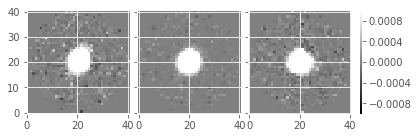

In [43]:
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)),
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))), clim=(-0.001,0.001))

For comparison:

(41, 41)
(ixx=2.72599732478, iyy=2.7870683575, ixy=0.0229174575788)


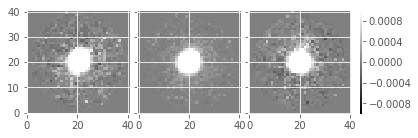

In [44]:
psf = exposure2.getPsf()
print psf.computeImage().getDimensions()
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))), clim=(-0.001,0.001))

In [45]:
mi = exposure.getMaskedImage()
img = mi.getImage()

print type(exposure)
print type(mi)
print type(img)

<class 'lsst.afw.image.imageLib.ExposureF'>
<class 'lsst.afw.image.imageLib.MaskedImageF'>
<class 'lsst.afw.image.imageLib.ImageF'>


In [46]:
def _isExposureOrMaskedImageOrImage(item):
    if (isinstance(item, afwImage.ExposureU) or isinstance(item, afwImage.ExposureI) or
          isinstance(item, afwImage.ExposureF) or isinstance(item, afwImage.ExposureD)):
        return 'exposure'
    elif (isinstance(item, afwImage.MaskedImageU) or isinstance(item, afwImage.MaskedImageI) or
          isinstance(item, afwImage.MaskedImageF) or isinstance(item, afwImage.MaskedImageD)):
        return 'maskedImage'
    elif (isinstance(item, afwImage.ImageU) or isinstance(item, afwImage.ImageI) or
          isinstance(item, afwImage.ImageF) or isinstance(item, afwImage.ImageD)):
        return 'image'
    return 'none'

In [47]:
print _isExposureOrMaskedImageOrImage(exposure)
print _isExposureOrMaskedImageOrImage(mi)
print _isExposureOrMaskedImageOrImage(img)

exposure
maskedImage
image
